In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
ben = np.load("data/benign.npy")
# adv = np.load("data/adversarial.npy")
# adv = np.load("data/adversarial_50.npy")
# adv = np.load("/home/sharwinbobde/Downloads/aes.npy")
# adv = np.load("data/aes_topk_v2.npy")
adv = np.load("data/aes_final.npy")
# mal = np.load("data/malicious.npy")
mal = np.load("data/mal_final.npy")

ben_freq = np.sum(ben, axis=0)
adv_freq = np.sum(adv, axis=0)
mal_freq = np.sum(mal, axis=0)
ben.shape

(8008, 22761)

In [3]:
adv.shape

(15200, 22761)

In [7]:
mal.shape

(15200, 22761)

In [11]:

def visualize_adv_benign_compaison(ben, mal, adv, sort_on, plot_range, title:str):
    ben_freq = np.sum(ben, axis=0)
    adv_freq = np.sum(adv, axis=0)
    mal_freq = np.sum(mal, axis=0)
    idx = np.argsort(-sort_on)
    barWidth = 0.45
    
    # set height of bar
    top_count_range = plot_range
    bars1 = ben_freq[idx[top_count_range]]
    bars2 = mal_freq[idx[top_count_range]]
    bars3 = adv_freq[idx[top_count_range]]

    ymax = np.max([bars1, bars2, bars3])

    # Set position of bar on X axis
    r1 = top_count_range
    r2 = [x + barWidth for x in r1]
    # r3 = [x + barWidth*2 for x in r1]

    # Make the plot
    fig, axs = plt.subplots(2,1) 
    fig.suptitle(title)
    fig.set_size_inches((24, 6))
    axs[0].bar(r1, bars1, color="green", width=barWidth, edgecolor='white', label='benign')
    axs[1].bar(r1, bars2, color='red', width=barWidth, edgecolor='white', label='malicious')
    axs[1].bar(r2, bars3, color='blue', width=barWidth, edgecolor='white', label='adversarial')
    
    # Add xticks on the middle of the group bars
    for i in range(2):
        axs[i].set_ylim((0, ymax))
        axs[i].set_xlim((top_count_range[0], top_count_range[-1]))
        axs[i].set_xlabel('Feature Index', fontweight='bold')
        # xticks = top_count_range
        # axs[i].set_xticks(xticks)
        # axs[i].set_xticklabels(idx[top_count_range])
        axs[i].legend()
    
    # Create legend & Show graphic
    plt.show()

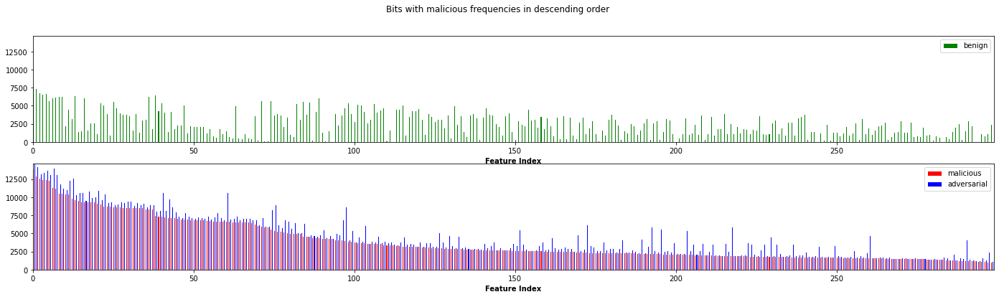

In [12]:
visualize_adv_benign_compaison(ben, mal, adv, mal_freq, range(300), 'Bits with malicious frequencies in descending order')

In [8]:
switched_0_to_1 = adv - mal
seitched_freq = np.sum(switched_0_to_1, axis=0)
np.unique(switched_0_to_1)

array([-1.,  0.,  1.,  2.], dtype=float32)

The uniques being 0 and 1 (and no -1s) tells us that no bit was switched from a 1 to a 0.

In [8]:
def visualize_switched_bits_comparison(ben, mal, adv, sort_on, plot_range, title:str):
    ben_freq = np.sum(ben, axis=0)
    adv_freq = np.sum(adv, axis=0)
    mal_freq = np.sum(mal, axis=0)

    switched_0_to_1 = adv - mal
    seitched_freq = np.sum(switched_0_to_1, axis=0)
    idx = np.argsort(-sort_on)
    barWidth = 1
    
    # set height of bar
    top_count_range = plot_range
    bars1 = ben_freq[idx[top_count_range]]
    bars2 = seitched_freq[idx[top_count_range]]

    ymax = np.max([bars1, bars2])
    ymin = np.min([bars1, bars2])
    ymin = np.min([0, ymin])

    # Set position of bar on X axis
    r1 = top_count_range
    r2 = [x + barWidth for x in r1]
    # r3 = [x + barWidth*2 for x in r1]

    # Make the plot
    fig, axs = plt.subplots(1,1) 
    fig.suptitle(title)
    fig.set_size_inches((24, 6))
    axs.bar(r1, bars1, color="green", width=barWidth, label='benign bits frequeny',alpha = 0.6)
    axs.bar(r1, bars2, color='blue', width=barWidth, label='switched bits frequency', alpha = 0.4)
    
    # Add xticks on the middle of the group bars
    for i in range(1):
        axs.set_ylim((ymin, ymax))
        axs.set_xlim((top_count_range[0], top_count_range[-1]))
        axs.set_xlabel('Feature Index', fontweight='bold')
        # xticks = top_count_range
        # axs[i].set_xticks(xticks)
        # axs[i].set_xticklabels(idx[top_count_range])
        axs.legend()
    
    # Create legend & Show graphic
    plt.show()

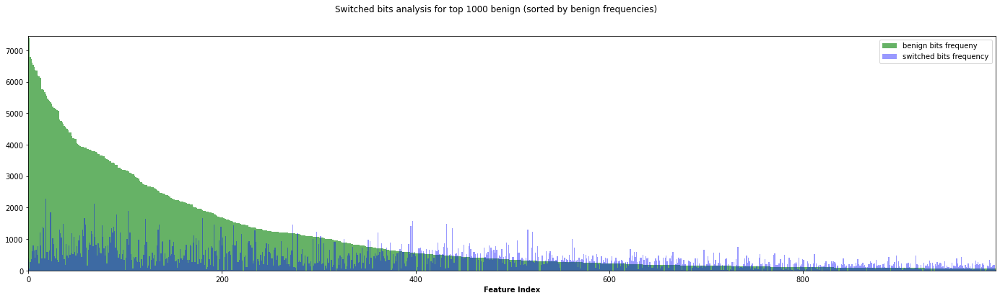

In [9]:
visualize_switched_bits_comparison(ben, mal, adv, ben_freq, range(1000), 'Switched bits analysis for top 1000 benign (sorted by benign frequencies)' )

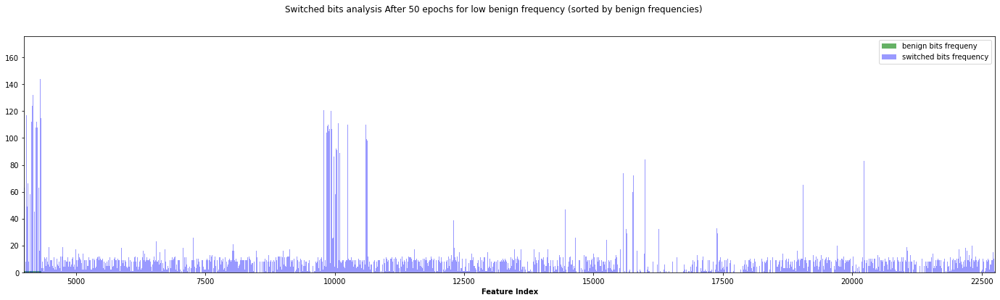

In [10]:
visualize_switched_bits_comparison(ben, mal, adv, ben_freq, np.arange(4000, 22760), 'Switched bits analysis After 50 epochs for low benign frequency (sorted by benign frequencies)' )

### Analysisng adversarial bits after 50 epochs

In [11]:
adv_50 =np.load("data/adversarial_50.npy")
ben_50 = np.load("data/benign_50.npy")
mal_50 = np.load("data/malicious_50.npy")

ben_50_freq = np.sum(ben, axis=0)
adv_50_freq = np.sum(adv, axis=0)
mal__50freq = np.sum(mal, axis=0)

switched_0_to_1 = adv_50 - mal_50
switched_freq = np.sum(switched_0_to_1, axis=0)

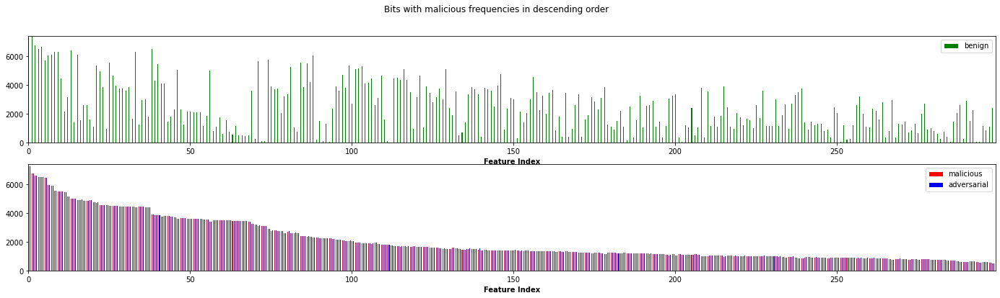

In [12]:
visualize_adv_benign_compaison(ben_50, mal_50, adv_50, mal_freq, range(300), 'Bits with malicious frequencies in descending order')

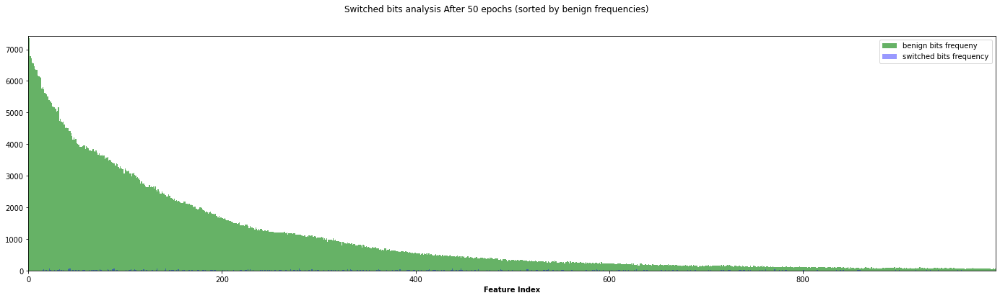

In [13]:
visualize_switched_bits_comparison(ben_50, mal_50, adv_50, ben_50_freq, np.arange(1000), 'Switched bits analysis After 50 epochs (sorted by benign frequencies)' )

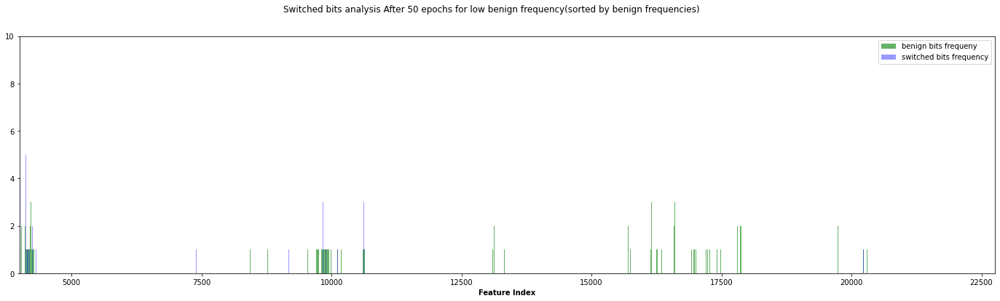

In [14]:
visualize_switched_bits_comparison(ben_50, mal_50, adv_50, ben_50_freq, np.arange(4000, 22760), 'Switched bits analysis After 50 epochs for low benign frequency(sorted by benign frequencies)' )